## TensorBoard  : visualiser le Graph de calculs de TensorFlow

## Objectif
Nous allons voir ensemble comment **visualiser** le **graph de calcul** de Tensorflow

## Pré-requis
Vous connaissez déjà les structures de données de TensorFlow
* Constantes, variables, tenseurs, opérations
* le graph de calcul de TensorFlow
* le modèle d'exécution de TensorFlow (*lazy computations*)



In [0]:
# chargement '02-06-graph_vis_animation.gif'
from google.colab import files
dataset = files.upload()

## Trailer
Exécuter la cellule ci-dessous, pour avoir un aperçu de ce que nous allons faire.

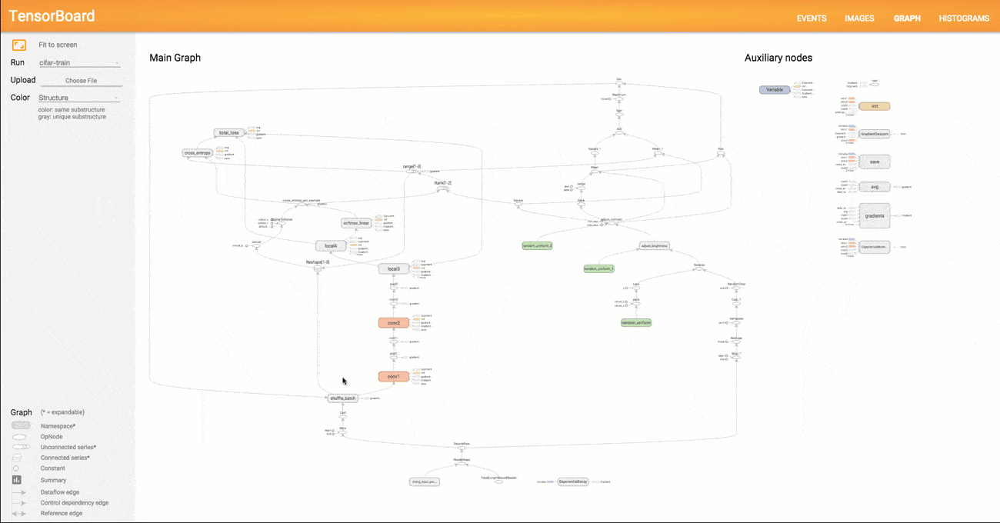

In [4]:
#@title TensorBoard
from IPython.display import Image
with open('02-06-graph_vis_animation.gif','rb') as f:
    display(Image(data=f.read(), format='png' , width=600, height=600))

## Tensor Board
### Name scope
Afin d'organiser l'affichage du graph de calcul, on peut faire des regroupements de noeuds et de variables.


Pour cela, on utilise ``` tf.name_scope('nom_regroup')```

### Exercice

* Initialiser 3  variables (x , y , z) 
* puis les regrouper dans le même scope à l'aide de ``` tf.name_scope('nom_regroup')```


```
with tf.name_scope("var"):
  var_1 = tf.Variable(2 , name="var_1")
  var_2 = tf.Variable(2 , name="var_2")
```


* afficher le nom du noeud auquel appartient chacune des 3 variables (utiliser ```
nom_variable.op.name
```)

```
print var_1.op.name
```






In [0]:
# votre code ici

In [5]:
#@title
import tensorflow as tf

with tf.name_scope("var"):
  x = tf.Variable(2 , name="x")
  y = tf.Variable(2 , name="y")
  z = tf.Variable(2 , name="z")
print x.op.name
print y
print z

var_1/x
<tf.Variable 'var_1/y:0' shape=() dtype=int32_ref>
<tf.Variable 'var_1/z:0' shape=() dtype=int32_ref>


Toutes les variables sont maintenant préfixées

## Un exemple de visualisation
Commençons par un exemple simple.

Nous effectuons une addition, puis nous visualisons le graph correspondant à cette opération

In [6]:
%load_ext tensorboard.notebook
import tensorflow as tf

from tensorflow.python.summary.writer.writer import FileWriter

# pas duplication graph à chaque exécution ...
tf.reset_default_graph()

with tf.name_scope("var"):
  x = tf.constant(2 , name="x")
  y = tf.Variable(2 , name="y")
  
  z = tf.add(x , y)
  
FileWriter('logs/train', graph = z.graph).close()
FileWriter('logs/train').close()
%tensorboard --logdir logs/train

## Un exemple de graph d'un modèle de Deep Learning

In [7]:
%load_ext tensorboard.notebook
import tensorflow as tf
#tf.compat.v1.disable_eager_execution()
from tensorflow.python.ops.array_ops import placeholder
from tensorflow.python.training.gradient_descent import GradientDescentOptimizer
from tensorflow.python.summary.writer.writer import FileWriter

# pas duplication graph à chaque exécution ...
tf.reset_default_graph()

with tf.name_scope('inputs'):
    x = placeholder(tf.float32, shape=[None, 2], name='x')
    y = placeholder(tf.int32, shape=[None], name='y')

with tf.name_scope('network'):    
  with tf.name_scope('dense_layer'):
      layer = tf.keras.layers.Dense(units=2)
      logits = layer(x)

  with tf.name_scope('training_engine') :     
    with tf.name_scope('loss'):
        xentropy = tf.nn.sparse_softmax_cross_entropy_with_logits(labels=y, logits=logits)
        loss_op = tf.reduce_mean(xentropy)

    with tf.name_scope('optimizer'):
      learning_rate = 0.01    
      optimizer = GradientDescentOptimizer(learning_rate=learning_rate)
      train_op = optimizer.minimize(loss_op)

FileWriter('logs/train', graph=train_op.graph).close()
FileWriter('logs/train').close()
%tensorboard --logdir logs/train

The tensorboard.notebook extension is already loaded. To reload it, use:
  %reload_ext tensorboard.notebook


Reusing TensorBoard on port 6006 (pid 212), started 0:01:48 ago. (Use '!kill 212' to kill it.)